imports

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch

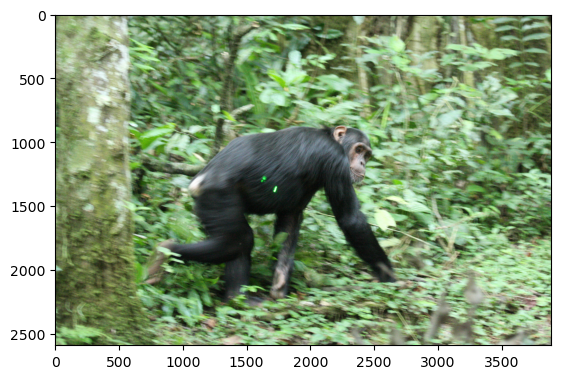

In [2]:
img = cv2.imread('sample_data/IMG_0378.JPG')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

Helper functions for displaying points, boxes, and masks

In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [4]:
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
# sam.to(device=device)

predictor = SamPredictor(sam)

In [5]:
predictor.set_image(img)

[W NNPACK.cpp:53] Could not initialize NNPACK! Reason: Unsupported hardware.


In [6]:
input_point = np.array([[2000, 1100]])
input_label = np.array([1])

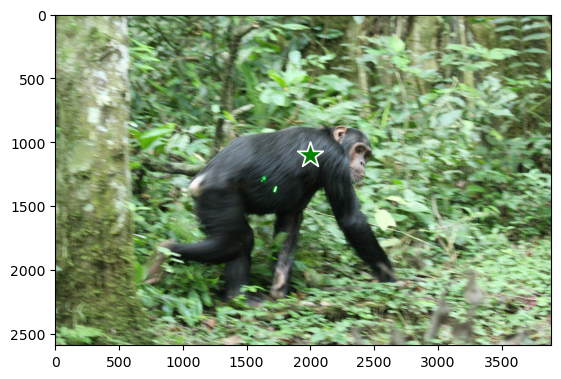

In [7]:
plt.imshow(img)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [8]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

In [9]:
masks.shape  # (number_of_masks) x H x W

(3, 2592, 3888)

In [10]:
print(scores)
max_idx = np.argmax(scores)
max_idx

[0.96582925 1.0030053  0.9754051 ]


1

In [11]:
masks[max_idx].shape

(2592, 3888)

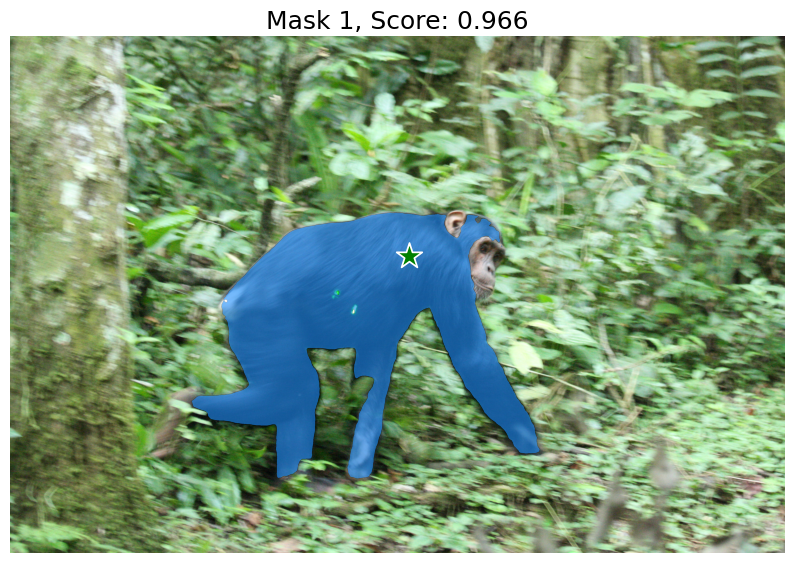

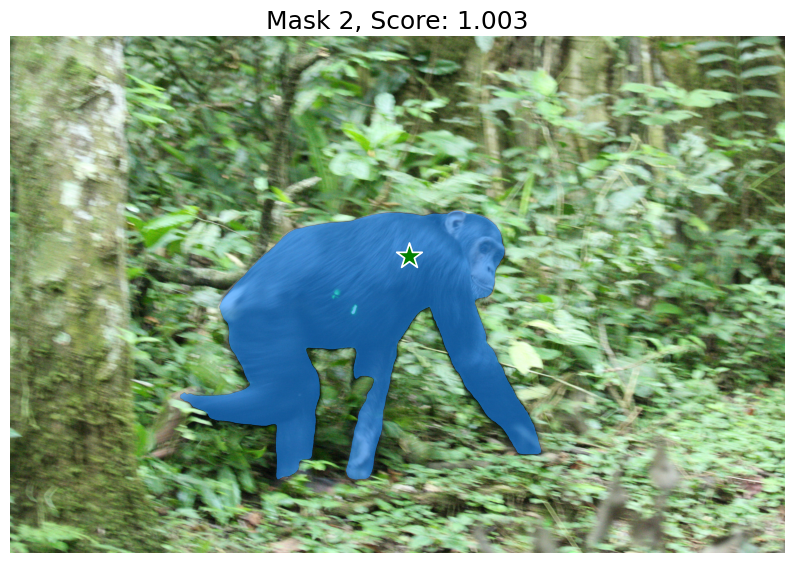

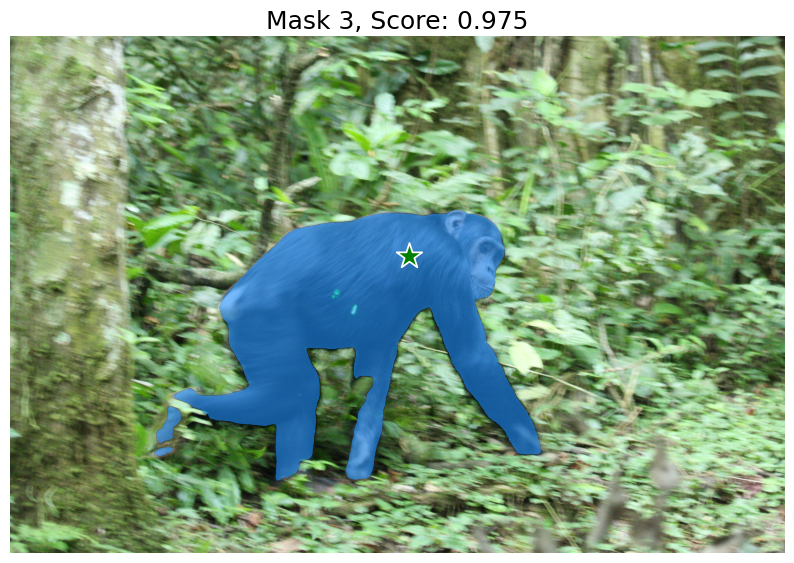

In [12]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

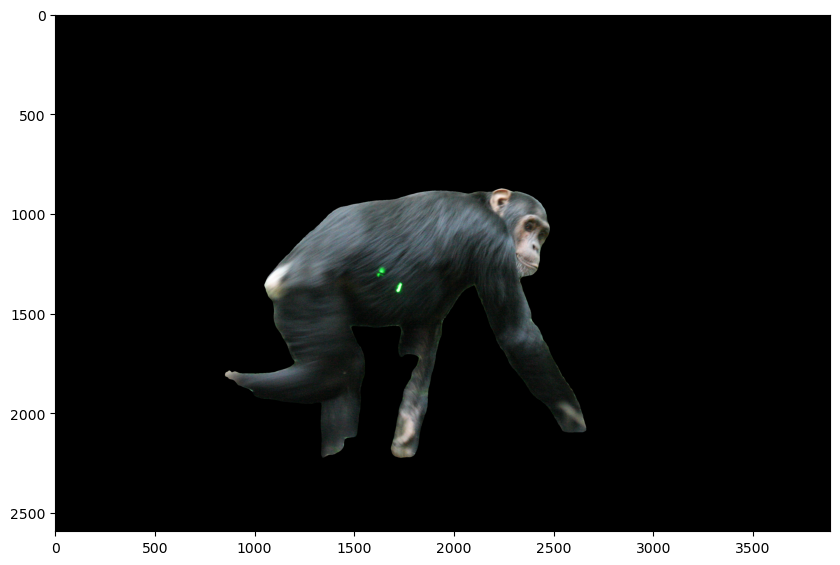

In [13]:
# get best mask
best_mask = masks[max_idx]
output = np.zeros_like(img)
output[best_mask] = img[best_mask]

# show result
plt.figure(figsize=(10,10))
plt.imshow(output)
plt.show()

Use segmented image to run laser detection algorithm

In [56]:
from skimage.feature import blob_log

In [64]:
hsv_frame = cv2.cvtColor(output, cv2.COLOR_BGR2HSV) #convert from BGR to HSV 

low_green = np.array([55, 110, 110])  #low_green values for green mask
high_green = np.array([65, 255, 255]) #high_green values for green mask
green_mask = cv2.inRange(hsv_frame, low_green, high_green) #performs basic threshold
green = cv2.bitwise_and(output, output, mask=green_mask)#performs bitwise and operation

g = green[:,:,1] #extracts the green channel
blur = cv2.GaussianBlur(g,(25,25),0) #adds blurring for smoothing
ret3,thresh = cv2.threshold(blur,210,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU) #thresholding technique - pixel values <210 turn to 0, pixel values >210 turn to 255


thresh = cv2.dilate(thresh,(5,5),iterations=28) #adds dilation to enlarge dots a bit can be tuned with the arguments



blobs = blob_log(thresh, max_sigma=50, threshold=0.15) # blob detection
count =0
if blobs.size != 0:  #checks if a blob was found
    for blob in blobs[:2,:]:
        y, x, area = blob
        if area>1:   #checks for area of blob
            count +=1
            result1 = cv2.circle(img.copy(), (int(x),int(y)),24,(0,0,255),-1) # draws circles on detected blob

In [65]:
print(count)

2


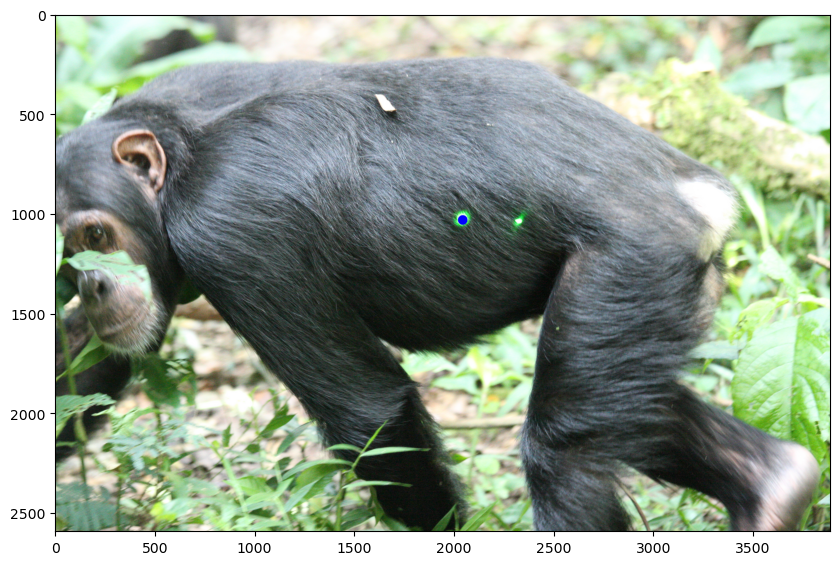

In [66]:
plt.figure(figsize=(10,10))
plt.imshow(result1)
plt.show()

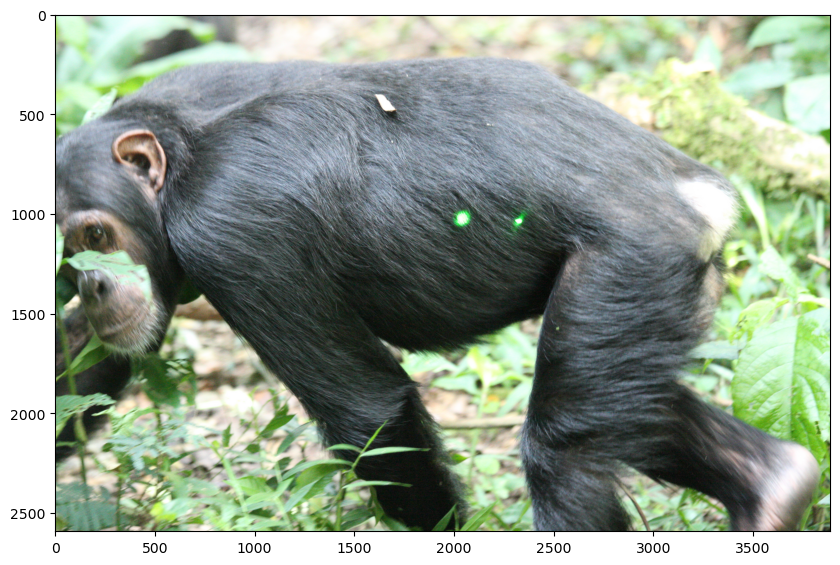

In [59]:
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

Let's test segmenting with box approach

In [60]:
print(img.shape)

(2592, 3888, 3)


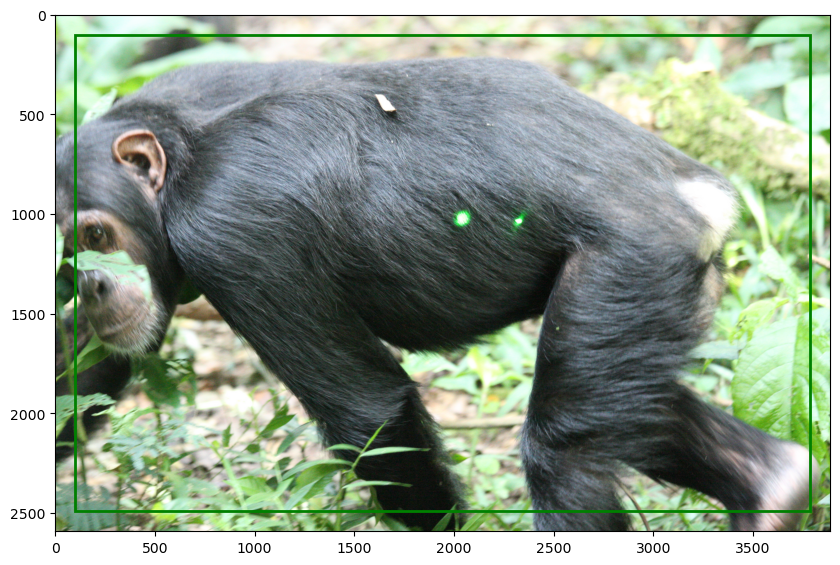

In [61]:
input_box = np.array([100, 100, 3788, 2492])
plt.figure(figsize=(10,10))
plt.imshow(img)
show_box(input_box, plt.gca())
plt.axis('on')
plt.show()

In [68]:
masks, scores, logits = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=True,
)

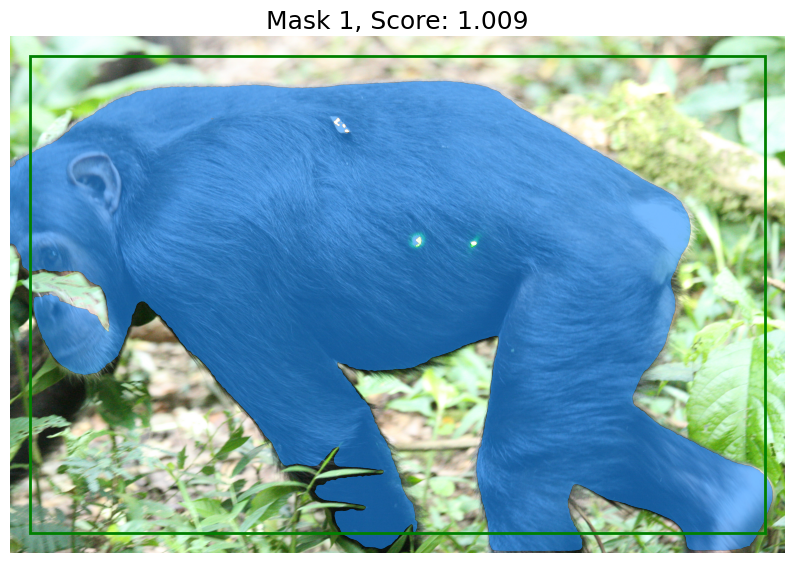

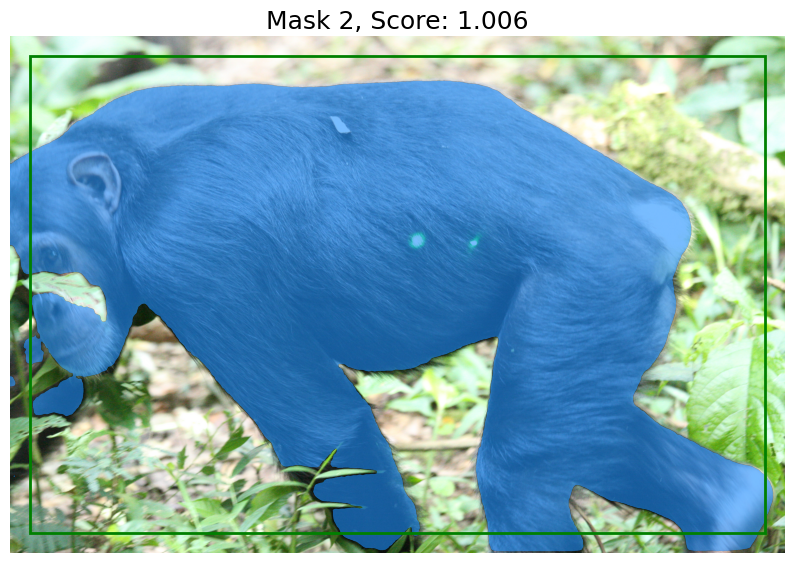

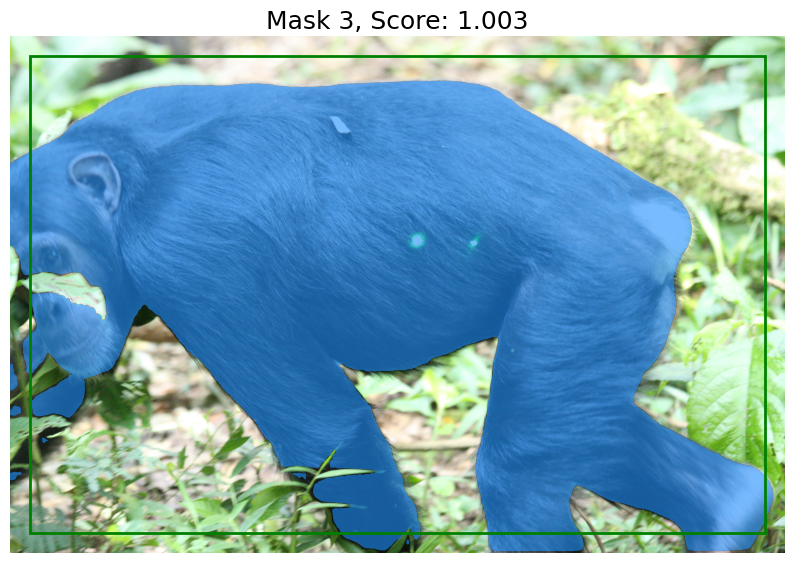

In [69]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(masks[i], plt.gca())
    show_box(input_box, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

### Test pipeline from json data. At this point SAM has already been run now we just need to detect the laser pointers

In [2]:
import json
import os

image_folder = 'sample_data'
masks_folder = 'sample_data_masks'
json_file = 'im_coords_masks.json'

# Load the JSON data
with open(json_file, 'r') as file:
    im_data = json.load(file)

In [3]:
im_data.keys()

dict_keys(['IMG_0615.JPG', 'IMG_0831.JPG', 'IMG_0896.JPG', 'IMG_0840.JPG', 'IMG_0784.JPG', 'IMG_0626.JPG', 'IMG_0378.JPG', 'IMG_0839.JPG'])

In [4]:
im1_data = im_data['IMG_0615.JPG']
im1_data

{'x': 1889, 'y': 1118, 'mask': 'IMG_0615_mask.png'}

In [5]:
source_path = os.path.join(image_folder, 'IMG_0615.JPG')
source = cv2.imread(source_path)
source = cv2.cvtColor(source, cv2.COLOR_BGR2RGB)

In [9]:
type(source[0][0][0])

numpy.uint8

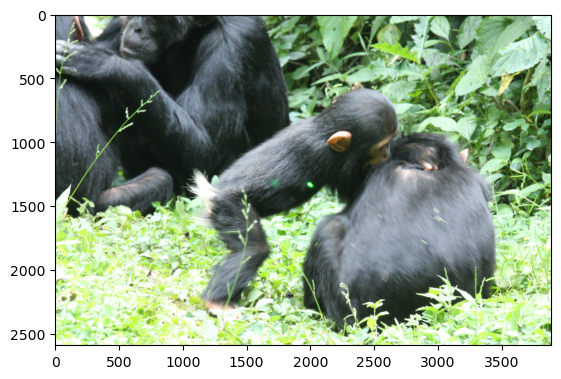

In [7]:
plt.imshow(source)

In [16]:
mask_path = os.path.join(masks_folder, im1_data['mask'])
mask = cv2.imread(mask_path)

In [22]:
np.sum(mask)

3297693

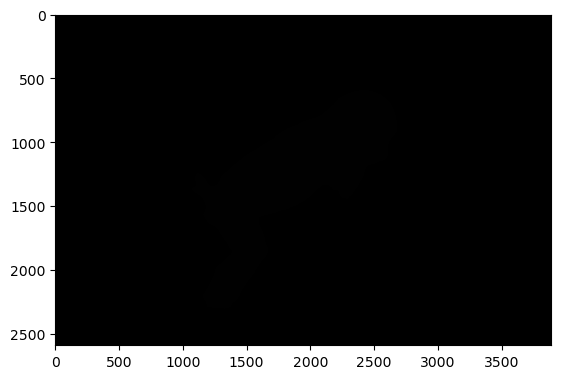

In [19]:
plt.imshow(mask)

In [11]:
mask

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [23]:
masked_im = np.zeros_like(source)

# Apply the mask
masked_im[mask] = source[mask]

: 

In [20]:
import laser_detection as ld

In [21]:
result, points = ld.detect_laser_points(masked_im, source)

UnboundLocalError: local variable 'result1' referenced before assignment